In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
filename = 'P:/CoxaAI/preprocess_data/csv_detection_info/sortering 2/AA.csv'
filename_clean = 'P:/CoxaAI/preprocess_data/csv_detection_info_clean/sortering 2/AA.csv'
saved_cropped_image = 'P:/CoxaAI/preprocess_data/cropped/sortering 2/AA'

In [3]:
detection_df = pd.read_csv(filename)

In [4]:
detection_df

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw
0,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1027,1244,1080,1237,0.985580,False,0,AA
1,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1066,1254,448,588,0.974214,False,0,AA
2,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1022,1229,1063,1221,0.978029,False,0,AA
3,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1043,1228,438,579,0.972015,False,0,AA
4,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29590.20230109.124357.0.dcm,1-22060403,1.2.276.0.95.29590.20230109.124357.0.dcm_h1,2561,2857,1874,2094,0.986331,True,0,AA
...,...,...,...,...,...,...,...,...,...,...,...,...
288,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.111232.0.2.15444...,1-23006199,1.2.276.0.95.29487.1.20230118.111232.0.2.15444...,953,1128,910,1036,0.982341,False,0,AA
289,P:/CoxaAI/Sortering 2/AA,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1-23006249,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1287,1416,885,976,0.996125,False,0,AA
290,P:/CoxaAI/Sortering 2/AA,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1-23006249,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1293,1423,1348,1439,0.993016,False,0,AA
291,P:/CoxaAI/Sortering 2/AA,1.2.392.200036.9125.4.0.2720224113.2768299792....,1-23006322,1.2.392.200036.9125.4.0.2720224113.2768299792....,652,752,744,817,0.946574,False,0,AA


### [Optional] Sort by confidence (filter out bad prediction)

In [5]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [6]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([148, 198], dtype='int64')

Note that there two cases that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [7]:
# plot every 9 of them

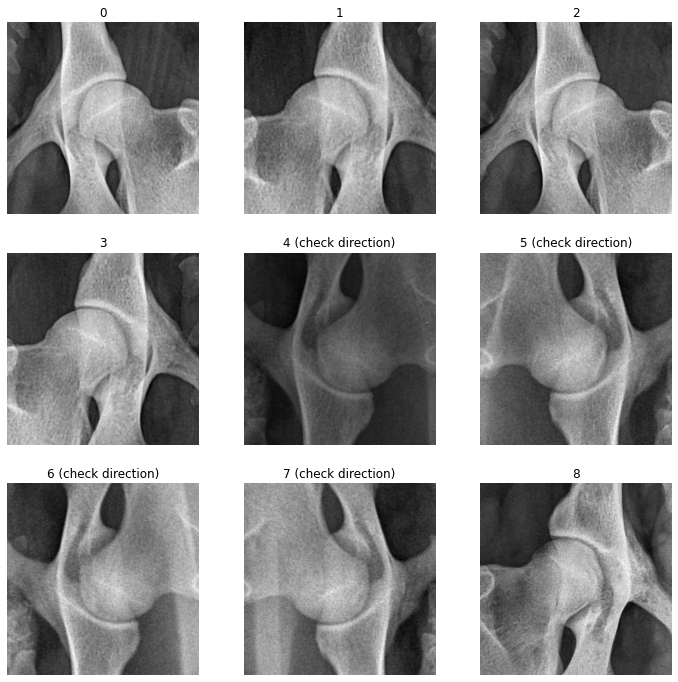

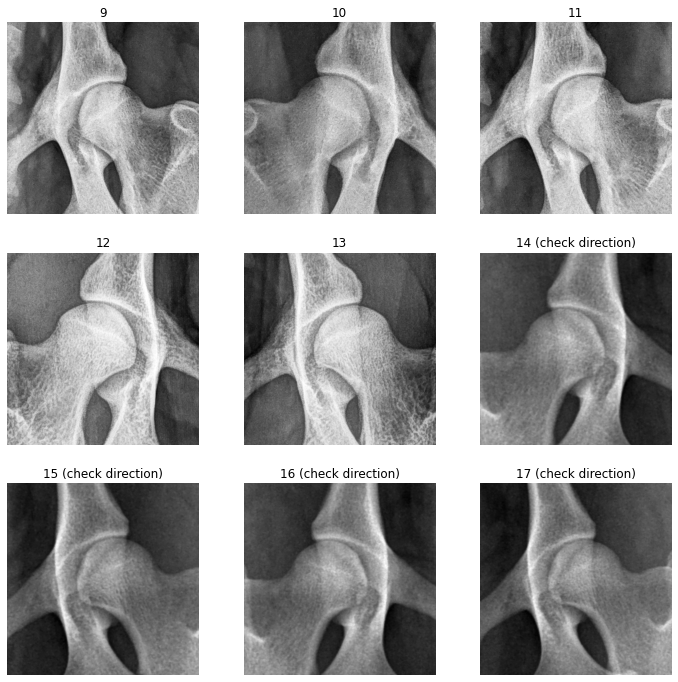

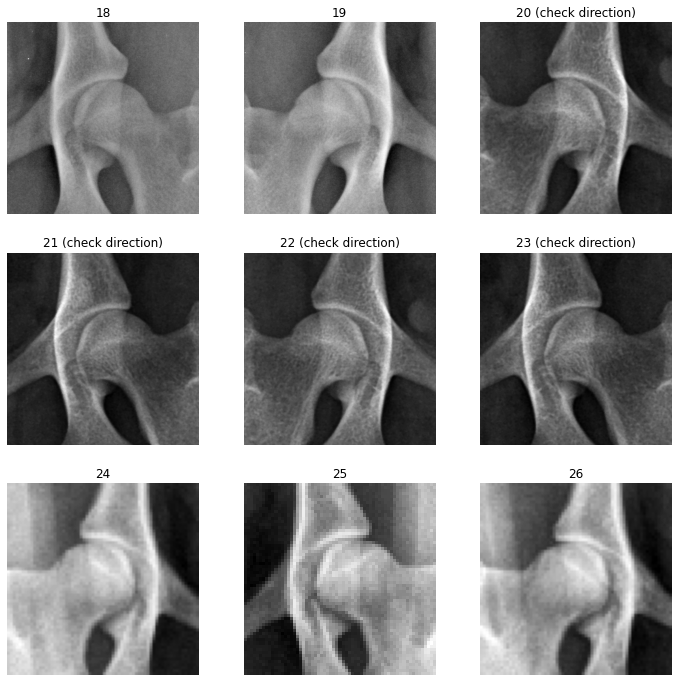

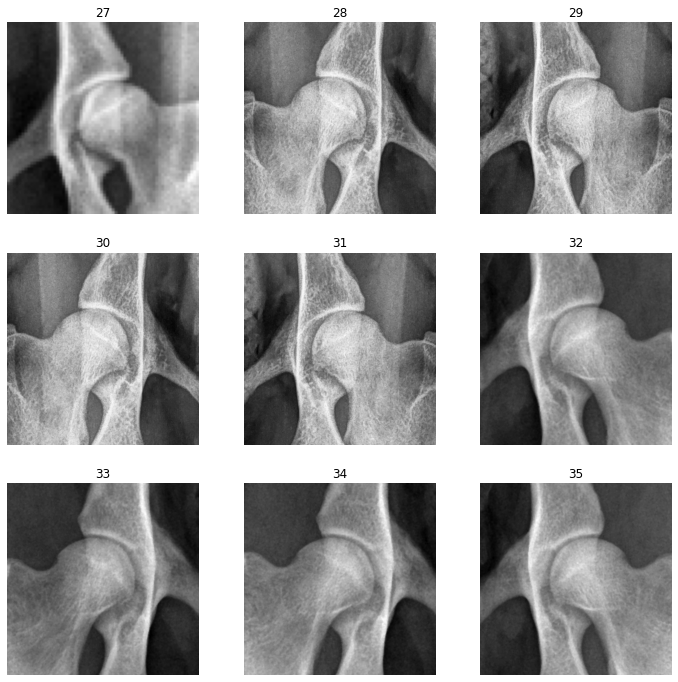

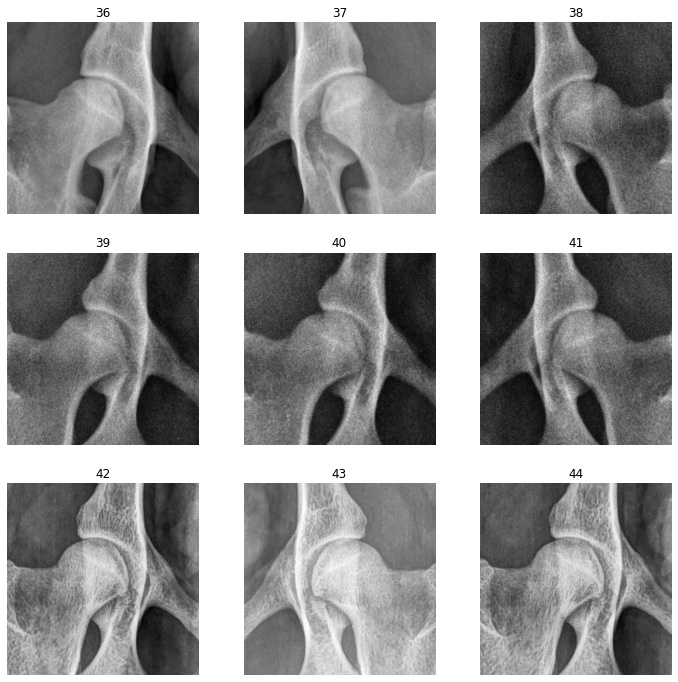

...

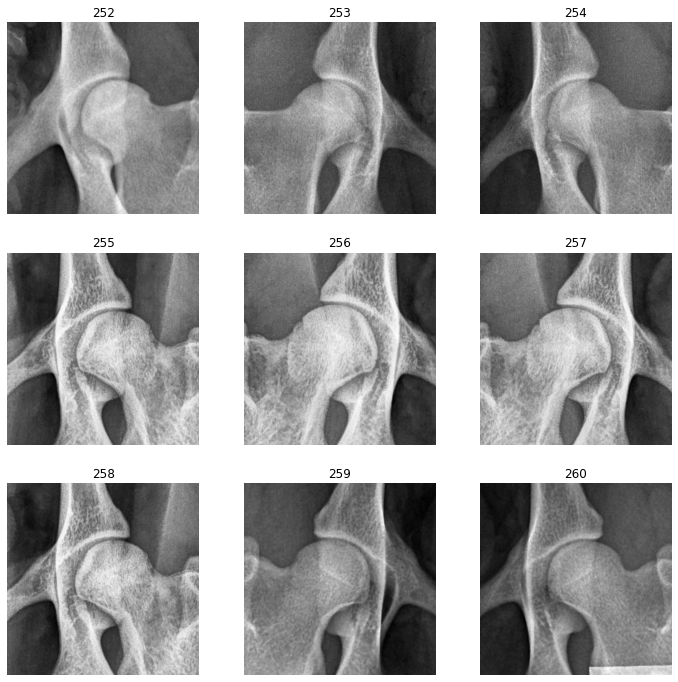

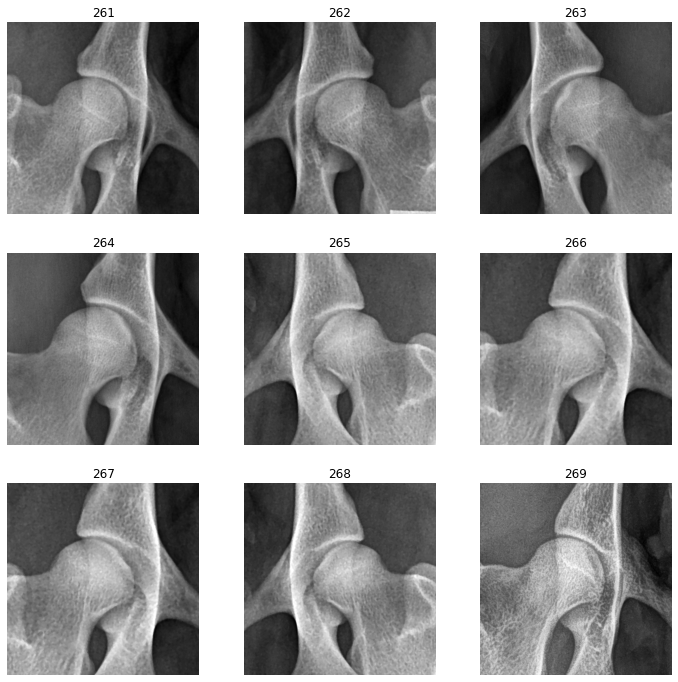

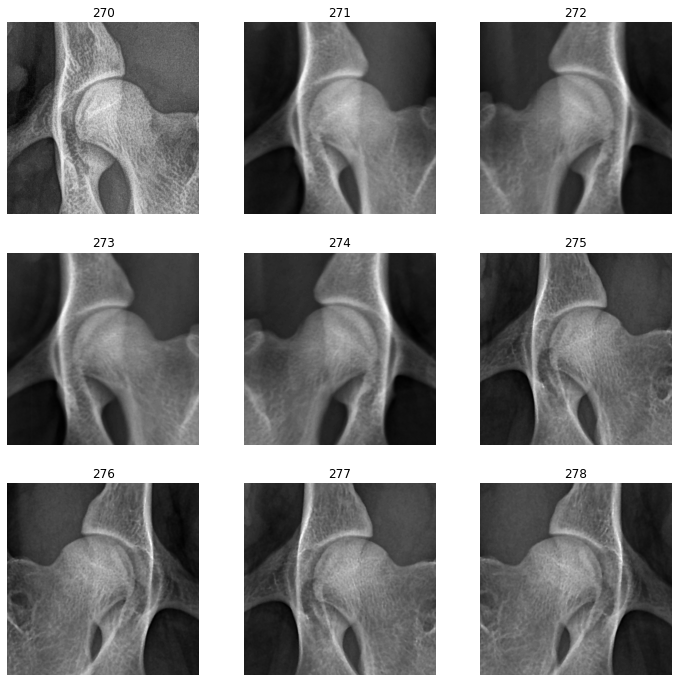

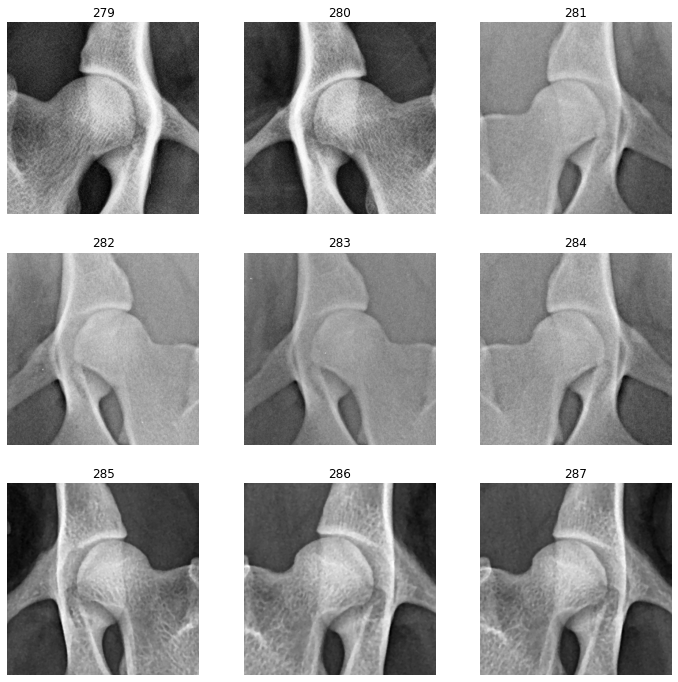

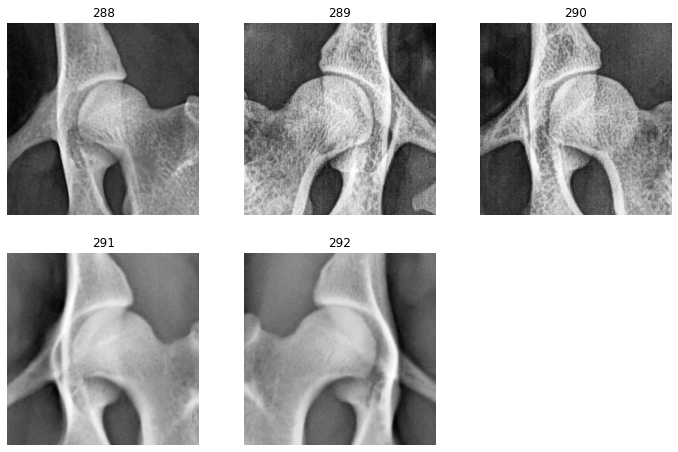

In [8]:
for id, item in detection_df.iterrows():
    fn = item['crop_name']
    img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    suffix = ' (check direction)' if item['is_rotated'] else ''
#     parent = item['parent_name']
#     if not pd.isnull(parent):
#         img = np.load(os.path.join(saved_cropped_image, parent,fn + '.npy'))
#     else:
#         img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id)+suffix)

    if (id%9) == 8:
        plt.show()                    
        
plt.show()

## Assign "flipped" column before removing failed predictions

In [9]:
flipped = np.array([False] * detection_df.shape[0])
flipped_indice = [4, 5, 6, 7]
flipped[detection_df.index.isin(flipped_indice)] = True
detection_df['flipped'] = flipped

## Remove bad detection items

In [10]:
remove_indice = [148, 149, 198]
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
0,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1027,1244,1080,1237,0.985580,False,0,AA,False
1,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120025.0.2.15440...,1066,1254,448,588,0.974214,False,0,AA,False
2,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1022,1229,1063,1221,0.978029,False,0,AA,False
3,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1-22053879,1.2.276.0.95.29487.1.20230118.120112.0.2.15440...,1043,1228,438,579,0.972015,False,0,AA,False
4,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29590.20230109.124357.0.dcm,1-22060403,1.2.276.0.95.29590.20230109.124357.0.dcm_h1,2561,2857,1874,2094,0.986331,True,0,AA,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
288,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.29487.1.20230118.111232.0.2.15444...,1-23006199,1.2.276.0.95.29487.1.20230118.111232.0.2.15444...,953,1128,910,1036,0.982341,False,0,AA,False
289,P:/CoxaAI/Sortering 2/AA,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1-23006249,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1287,1416,885,976,0.996125,False,0,AA,False
290,P:/CoxaAI/Sortering 2/AA,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1-23006249,1.3.51.0.7.1034513081.19971.35398.37361.65018....,1293,1423,1348,1439,0.993016,False,0,AA,False
291,P:/CoxaAI/Sortering 2/AA,1.2.392.200036.9125.4.0.2720224113.2768299792....,1-23006322,1.2.392.200036.9125.4.0.2720224113.2768299792....,652,752,744,817,0.946574,False,0,AA,False


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
exclude_ids = pd.read_csv('exclude_id.csv').id.values

In [13]:
new_detection_df = new_detection_df[~new_detection_df.parent_name.isin(exclude_ids)]

In [14]:
new_detection_df.to_csv(filename_clean, index=False)

In [15]:
detection_df[detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
148,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.31596.20230112.91917.0.dcm,1-23002099,1.2.276.0.95.31596.20230112.91917.0.dcm_h1,1617,1872,1609,1799,0.323854,False,0,AA,False
149,P:/CoxaAI/Sortering 2/AA,1.2.276.0.95.31596.20230112.92153.0.dcm,1-23002099,1.2.276.0.95.31596.20230112.92153.0.dcm_h1,1567,1829,1818,2014,0.534481,False,0,AA,False
198,P:/CoxaAI/Sortering 2/AA,1.2.826.0.1.3680043.2.876.18813.1.7.0.20230110...,1-23003139,1.2.826.0.1.3680043.2.876.18813.1.7.0.20230110...,624,811,1731,1873,0.460895,False,0,AA,False


In [21]:
for idx in exclude_ids:
     if idx.startswith('1-22') or idx.startswith('1-23'):
            print(idx)

In [24]:
for idx in new_detection_df.parent_name:
     if idx.startswith('1-18') or idx.startswith('1-19') or idx.startswith('1-20') or idx.startswith('1-21'):
            print(idx)